# Setup

## Install Detectron2

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
# !git clone 'https://github.com/facebookresearch/detectron2'
# dist = distutils.core.run_setup("./detectron2/setup.py")
# !python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
# sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Mon_May__3_19:15:13_PDT_2021
Cuda compilation tools, release 11.3, V11.3.109
Build cuda_11.3.r11.3/compiler.29920130_0
torch:  1.10 ; cuda:  cu113
detectron2: 0.6


## Install Semantic SAM

In [1]:
# !pip3 install torch==1.13.1 torchvision==0.14.1 --extra-index-url https://download.pytorch.org/whl/cu113
# python -m pip install 'git+https://github.com/MaureenZOU/detectron2-xyz.git'
# pip install git+https://github.com/cocodataset/panopticapi.git
# !git clone https://github.com/UX-Decoder/Semantic-SAM
# python -m pip install -r requirements.txt

Cloning into 'Semantic-SAM'...
remote: Enumerating objects: 628, done.
remote: Counting objects: 100% (343/343), done.
remote: Compressing objects: 100% (183/183), done.
remote: Total 628 (delta 210), reused 267 (delta 160), pack-reused 285
Receiving objects: 100% (628/628), 35.84 MiB | 7.03 MiB/s, done.
Resolving deltas: 100% (267/267), done.


In [5]:
%cd Semantic-SAM

/scratch/shabanza/segmentation/Semantic-SAM


In [9]:
%pip install transformers==4.19.2
%pip install kornia==0.6.4

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 493 kB 5.9 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


## Install Mask2Former

In [12]:
# clone and install Mask2Former
# !git clone https://github.com/facebookresearch/Mask2Former.git
%cd ..
%cd Mask2Former
# %pip install git+https://github.com/cocodataset/panopticapi.git
%pip install -r requirements.txt
%cd mask2former/modeling/pixel_decoder/ops
!python setup.py build install

/scratch/shabanza/segmentation
/scratch/shabanza/segmentation/Mask2Former
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
/scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.8
creating build/lib.linux-x86_64-3.8/functions
copying functions/ms_deform_attn_func.py -> build/lib.linux-x86_64-3.8/functions
copying functions/__init__.py -> build/lib.linux-x86_64-3.8/functions
creating build/lib.linux-x86_64-3.8/modules
copying modules/ms_deform_attn.py -> build/lib.linux-x86_64-3.8/modules
copying modules/__init__.py -> build/lib.linux-x86_64-3.8/modules
running build_ext
building 'MultiScaleDeformableAttention' extension
creating /scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/build/temp.linux-x86_64-3.8
creating /scratch/shabanza/segmentation/Mask2Former

In [13]:
%cd /scratch/shabanza/segmentation/Mask2Former
%cd mask2former/modeling/pixel_decoder/ops
!sudo sh make.sh
%cd /scratch/shabanza/segmentation/Mask2Former

/scratch/shabanza/segmentation/Mask2Former
/scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops
running build
running build_py
running build_ext
building 'MultiScaleDeformableAttention' extension
Emitting ninja build file /scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/build/temp.linux-x86_64-3.8/build.ninja...
Compiling objects...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)
ninja: no work to do.
g++ -pthread -shared -B /opt/conda/compiler_compat -L/opt/conda/lib -Wl,-rpath=/opt/conda/lib -Wl,--no-as-needed -Wl,--sysroot=/ /scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/build/temp.linux-x86_64-3.8/scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/src/vision.o /scratch/shabanza/segmentation/Mask2Former/mask2former/modeling/pixel_decoder/ops/build/temp.linux-x86_64-3.8/scratch/shabanza/segment

## Imports

In [1]:
# %cd Semantic-SAM
# from semantic_sam import prepare_image, plot_multi_results, build_semantic_sam, SemanticSAMPredictor, SemanticSamAutomaticMaskGenerator
# %cd ..

/home/yalda/IVRL_backup/shabanza_scratch/segmentation/Semantic-SAM


/home/yalda/IVRL_backup/shabanza_scratch/segmentation/Semantic-SAM/semantic_sam/modules/criterion_interactive_many_to_many.py:439: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if self.dn is not "no" and mask_dict is not None:


/home/yalda/IVRL_backup/shabanza_scratch/segmentation


In [1]:
import random
import cv2
import matplotlib.pyplot as plt

In [2]:
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys
# !{sys.executable} -m pip install opencv-python matplotlib
!{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'

!mkdir images
!wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

PyTorch version: 1.10.0+cu113
Torchvision version: 0.11.1+cu113
CUDA is available: True
Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-7aovb3ea
  Running command git clone -q https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-7aovb3ea
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36611 sha256=a6e4303ee410d2978ee830a7fdd5f5ad43481c36282950a6e3aeb7d1bd737707
  Stored in directory: /tmp/pip-ephem-wheel-cache-1a0o2ki5/wheels/b0/7e/40/20f0b1e23280cc4a66dc8009c29f42cb4afc1b205bc5814786
Successfully built segment-anything
mkdir: cannot create directory ‘images’: File exists
--2023-09-15 10:22:23--  https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.1

In [3]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [4]:
def show_anns(anns, key='stability_score'):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x[key]), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

# Dataset

In [5]:
from src.dataset.register_comic_instance import *
from detectron2.data import DatasetCatalog, MetadataCatalog

registering comic ...
loading sinergia json ...


Sinergia Json loaded.
registering placid ...


100%|██████████| 47256/47256 [00:00<00:00, 693462.10it/s]


registering yves ...


100%|██████████| 47256/47256 [00:00<00:00, 742956.86it/s]


In [6]:
dataset_name = DATASET_NAME

dataset_dicts = DatasetCatalog.get(dataset_name)
metadata = MetadataCatalog.get(dataset_name)

In [7]:
import random
from src.dataset.dataset_mapper import panel_mapper

In [8]:
sample = random.choice(dataset_dicts)
panels = panel_mapper(sample)

/home/shabanza/.local/lib/python3.8/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/home/shabanza/.local/lib/python3.8/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/home/shabanza/.local/lib/python3.8/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/home/shabanza/.local/lib/python3.8/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/home/shabanza/.local/lib/python3.8/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/home/shabanza/.local/lib/python3.8/site-packages/shapely/set_operations.py:133: RuntimeWarning

In [9]:
image = cv2.imread(sample['file_name'])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

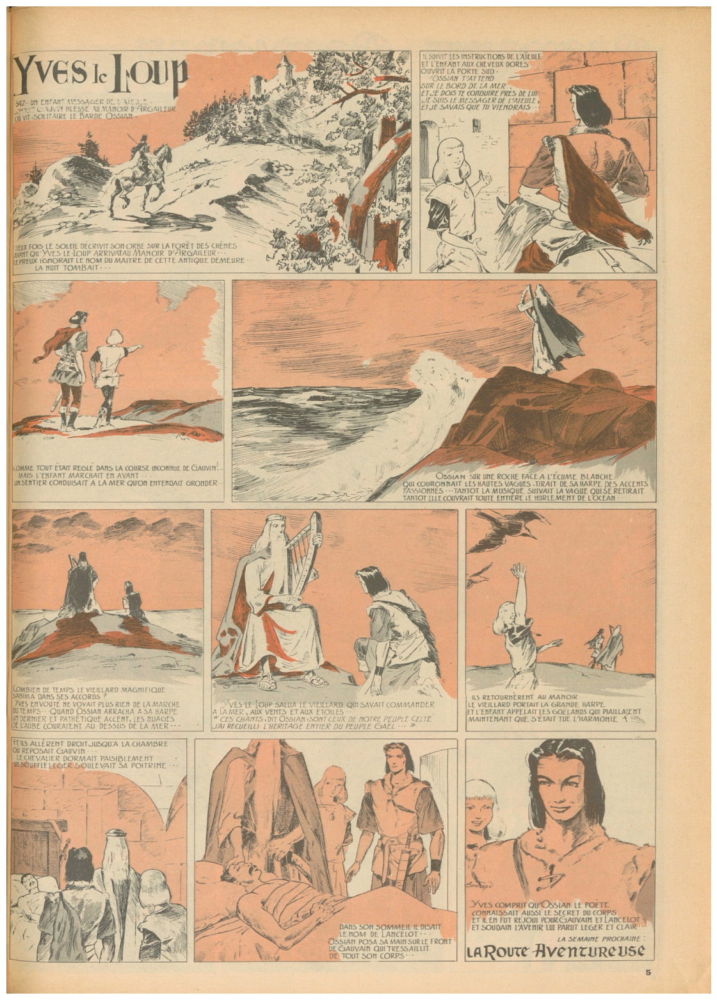

In [10]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

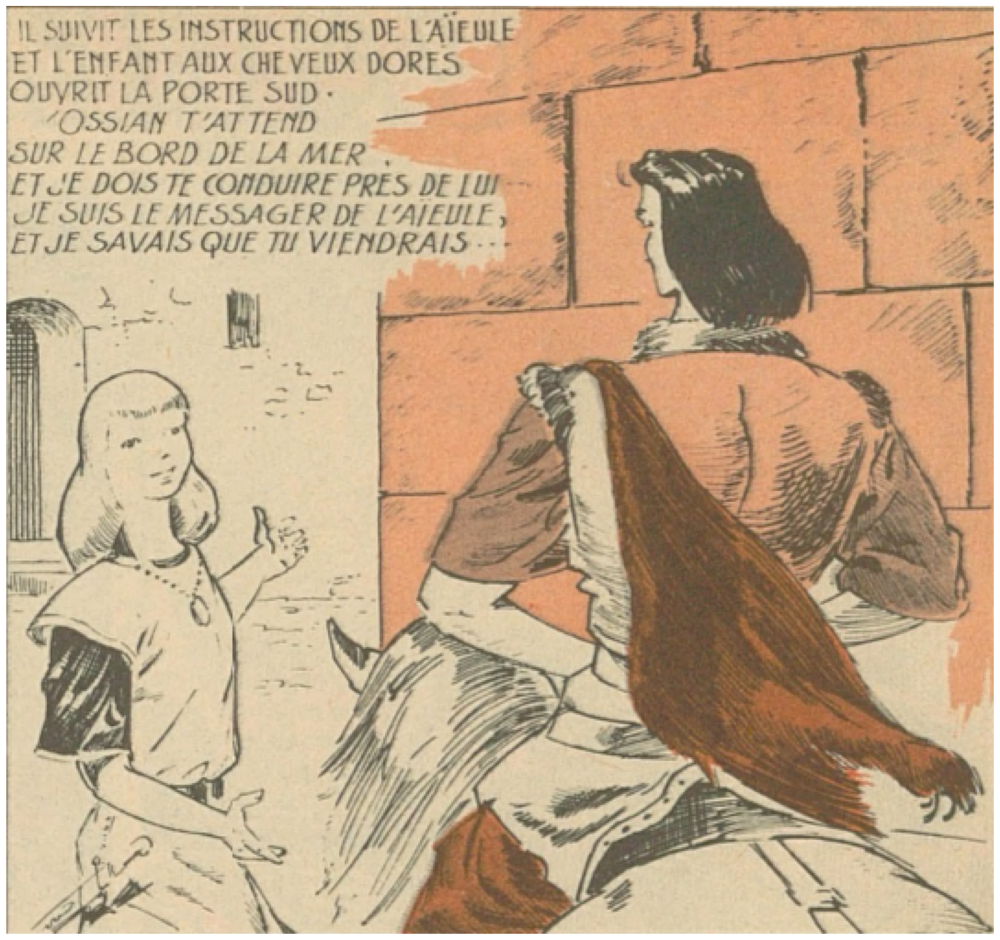

In [11]:
plt.figure(figsize=(20,20))
plt.imshow(panels[0]['image'])
plt.axis('off')
plt.show()

# Automatic Mask Generation

In [12]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "/sinergia/shabanza/checkpoints/sam/sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

In [13]:
masks = mask_generator.generate(panels[0]['image'])

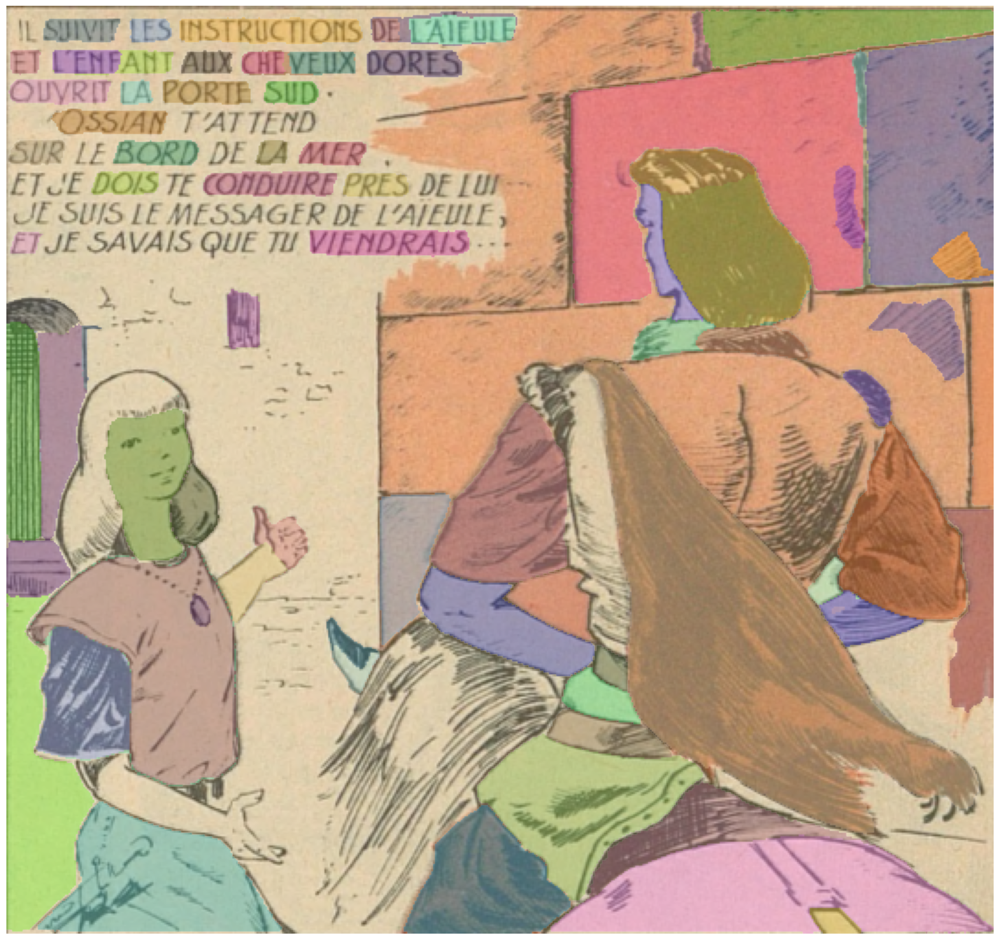

In [17]:
plt.figure(figsize=(20,20))
plt.imshow(panels[0]['image'])
show_anns(masks, key='area')
plt.axis('off')
plt.show() 

# Options

In [17]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

In [18]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=16,
    pred_iou_thresh=0.9,
    stability_score_thresh=0.7,
    crop_n_layers=1,
    crop_n_points_downscale_factor=4,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

In [21]:
masks2 = mask_generator_2.generate(panels[0]['image'])

In [25]:
len(masks2)

70

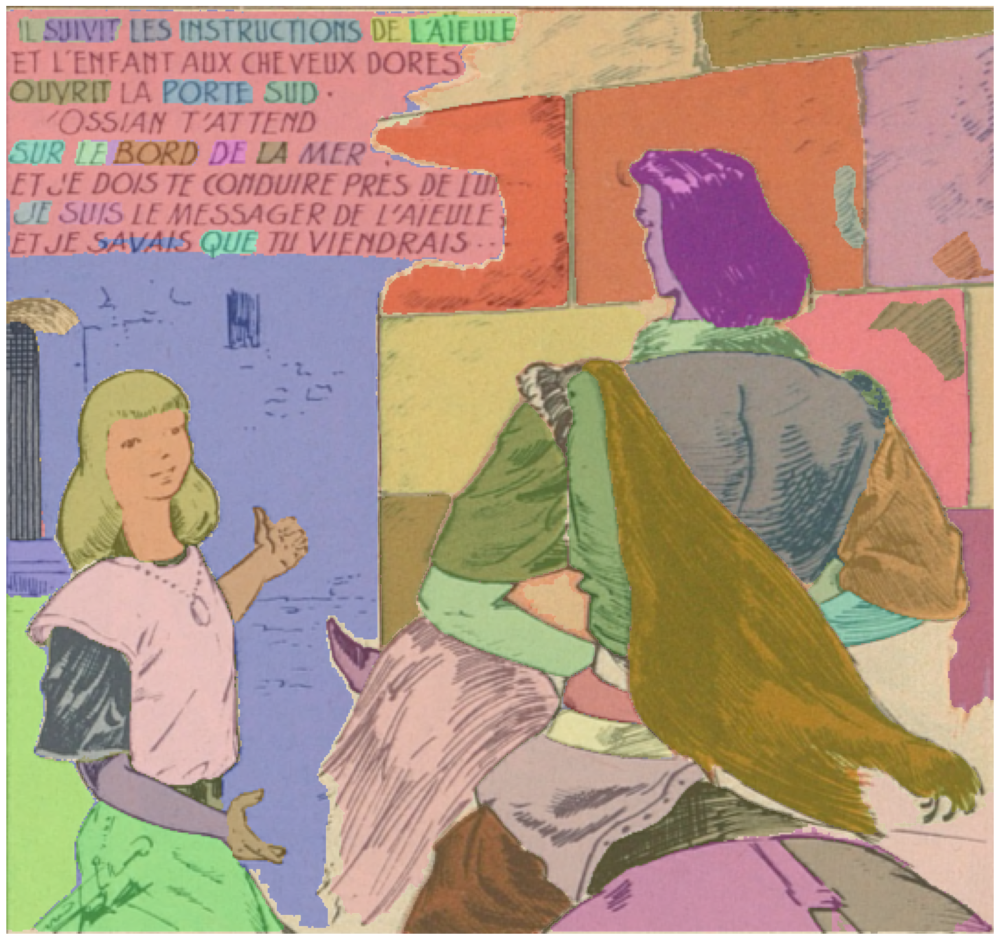

In [23]:
plt.figure(figsize=(20,20))
plt.imshow(panels[0]['image'])
show_anns(masks2, key='area')
plt.axis('off')
plt.show() 